In [1]:
# 0. Import
import os
import sys

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sns
import celloracle as co
import warnings
warnings.filterwarnings("ignore")

co.__version__

OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


'0.12.0'

In [2]:
# visualization settings
%config InlineBackend.figure_format = 'retina'
%matplotlib inline

plt.rcParams['figure.figsize'] = [6, 4.5]
plt.rcParams["savefig.dpi"] = 300
save_folder = "figures_testis"
sc.settings.figdir = save_folder
os.makedirs(save_folder, exist_ok=True)
# Load data.
# Here, we will use a hematopoiesis data by Paul 2015.
# You can load preprocessed data using a celloracle function as follows.
wild_file = 'testis/wt_prd_v6.h5ad'
diabete_file = 'testis/db_prd_v6.h5ad'

wt_adata = sc.read(wild_file)
db_adata = sc.read(diabete_file)
wt_adata.obs['cell_type'] = wt_adata.obs['ct_name'].replace(['Differentiating SPG'], ['SPG']) 
db_adata.obs['cell_type'] = db_adata.obs['ct_name'].replace(['Differentiating SPG'], ['SPG']) 
print('Data shape:', wt_adata.shape, db_adata.shape)

marker_genes = {'ES':['Prm1', 'Prm2', 'Tnp1', 'Tnp2'], 
                'RS': ['Tssk1', 'Acrv1', 'Spaca1', 'Tsga8'], 
                'SPC': ['Piwil1', 'Pttg1', 'Spag6', 'Tbpl1', 'Insl6'], 
                'SPG': ['Uchl1', 'Sycp1', 'Stra8', 'Crabp1'], 
                'Macrophage': ['Apoe', 'Dab2', 'Cd74', 'Adgre1'],
                'Endothelial': ['Vwf', 'Tie1', 'Tek', 'Ly6c1'],
                'Myoid': ['Acta2', 'Myh11', 'Myl6', 'Pdgfrb'],
                'Leydig': ['Cyp17a1', 'Cyp11a1', 'Star', 'Hsd3b1'],
                'Sertoli': ['Clu', 'Amhr2', 'Sox9', 'Ctsl', 'Rhox8']
                }


deg_markers = {'ES':['Prm1', 'Prm2', 'Tnp1', 'Tnp2'], 
               'RS': ['Tssk1', 'Acrv1', 'Spaca1', 'Tsga8'], 
               'SPC': ['Piwil1', 'Pttg1', 'Spag6', 'Tbpl1', 'Insl6'],
               'SPG': ['Uchl1', 'Sycp1', 'Stra8', 'Crabp1']
              } 
cell_types = list(marker_genes.keys())
testicular_cell_types = list(deg_markers.keys())
marker_genes_list = []
for k,v in marker_genes.items():        
    marker_genes_list += v

negative_gene_to_coefficient_dict = {'mt-Nd1': 2.240772116330779,   # wt module 2, db module 3
                                     'Tuba3b': 20.0,                # wt module 6, db module 4
                                     'Stmn1': 4.661355144844998,    # wt module -1, db module 4
                                     'Cypt4': 2.914946084728282,    # wt module 8, db module 8
                                     'mt-Cytb': 7.940721195057547,  # wt module 2, db module 3
                                     'Hsp90aa1': 7.719926741335844} # wt module 6, db module 3
positive_gene_to_coefficient_dict = {'Tnp2': 2.2300113564016115,    # wt module 1, db module 1
                                     'Smcp': 20.0,                  # wt module 1, db module 1
                                     'Gsg1': 10.749147113890643,    # wt module 1, db module 1
                                     'Oaz3': 13.684470608169942,    # wt module 1, db module 1
                                     'Hmgb4': 11.19717467780924,    # wt module 1, db module 1
                                     'Lyar': 3.205774497366639,     # wt module 6, db module 4
                                     'Prm1': 1.8021648809899742,    # wt module 1, db module 1
                                     'Dbil5': 2.4081140269931445}   # wt module 1, db module 1

gene_list_b = list(negative_gene_to_coefficient_dict.keys()) + list(positive_gene_to_coefficient_dict.keys())
print(marker_genes_list)
print(gene_list_b)

Data shape: (34279, 1373) (23859, 1373)
['Prm1', 'Prm2', 'Tnp1', 'Tnp2', 'Tssk1', 'Acrv1', 'Spaca1', 'Tsga8', 'Piwil1', 'Pttg1', 'Spag6', 'Tbpl1', 'Insl6', 'Uchl1', 'Sycp1', 'Stra8', 'Crabp1', 'Apoe', 'Dab2', 'Cd74', 'Adgre1', 'Vwf', 'Tie1', 'Tek', 'Ly6c1', 'Acta2', 'Myh11', 'Myl6', 'Pdgfrb', 'Cyp17a1', 'Cyp11a1', 'Star', 'Hsd3b1', 'Clu', 'Amhr2', 'Sox9', 'Ctsl', 'Rhox8']
['mt-Nd1', 'Tuba3b', 'Stmn1', 'Cypt4', 'mt-Cytb', 'Hsp90aa1', 'Tnp2', 'Smcp', 'Gsg1', 'Oaz3', 'Hmgb4', 'Lyar', 'Prm1', 'Dbil5']


In [3]:
base_GRN = co.data.load_mouse_scATAC_atlas_base_GRN()
print('Base GRN shape:', base_GRN.shape)
base_GRN.head()

Base GRN shape: (91976, 1095)


,peak_id,gene_short_name,9430076c15rik,Ac002126.6,Ac012531.1,Ac226150.2,Afp,Ahr,Ahrr,Aire,...,Znf784,Znf8,Znf816,Znf85,Zscan10,Zscan16,Zscan22,Zscan26,Zscan31,Zscan4
0,chr10_100050979_100052296,4930430F08Rik,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,chr10_101006922_101007748,SNORA17,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2,chr10_101144061_101145000,Mgat4c,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,chr10_10148873_10149183,9130014G24Rik,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,chr10_10149425_10149815,9130014G24Rik,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [4]:
smcp_base_grn = base_GRN[base_GRN.gene_short_name == 'Smcp']
smcp_base_grn['Stat4']

57433    1.0
Name: Stat4, dtype: float64

In [5]:
# Instantiate Oracle object
oracle_wt = co.Oracle()
# Check data in anndata
print("Metadata columns :", list(wt_adata.obs.columns))
print("Dimensional reduction: ", list(wt_adata.obsm.keys()))

Metadata columns : ['ct', 'ct_name', 'Pseudotime', 'total_counts', 'Normalized Pseudotime', 'xcoord_int', 'ycoord_int', 'Cluster', 'tubules', 'n_genes', 'n_counts', 'n_genes_by_counts', 'total_counts_mt', 'pct_counts_mt', 'cell_type']
Dimensional reduction:  ['spatial']


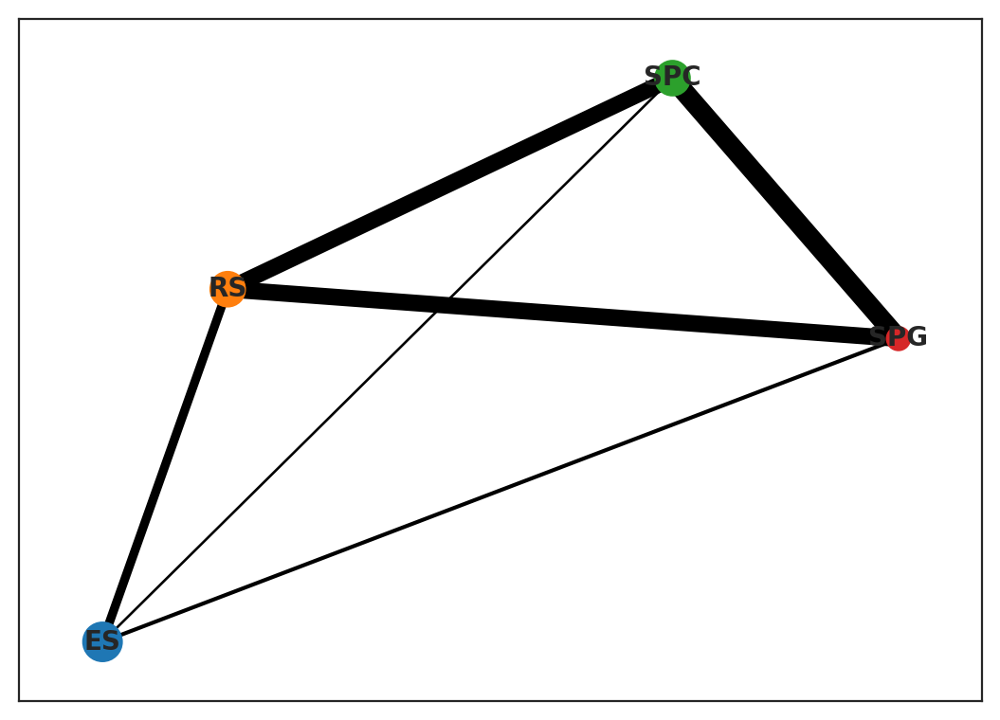

In [6]:
wt_adata = wt_adata[wt_adata.obs['cell_type'].isin(testicular_cell_types),:]

sc.pp.normalize_per_cell(wt_adata)
wt_adata.raw = wt_adata
wt_adata.layers["raw_count"] = wt_adata.raw.X.copy()
# Log transformation and scaling
sc.pp.log1p(wt_adata)
sc.pp.scale(wt_adata)

# PCA
sc.tl.pca(wt_adata, svd_solver='arpack')

# Diffusion map
sc.pp.neighbors(wt_adata, n_neighbors=4, n_pcs=20)

sc.tl.diffmap(wt_adata)
# Calculate neihbors again based on diffusionmap
sc.pp.neighbors(wt_adata, n_neighbors=10, use_rep='X_diffmap')

# PAGA graph construction
sc.tl.paga(wt_adata, groups='cell_type')
plt.rcParams["figure.figsize"] = [6, 4.5]
sc.pl.paga(wt_adata)

In [7]:
wt_adata.uns['cell_type_colors'] = ['#32cd32', '#008b8b', '#800080', '#87ceeb'] #'limegreen', 'darkcyan', 'purple', 'skyblue'

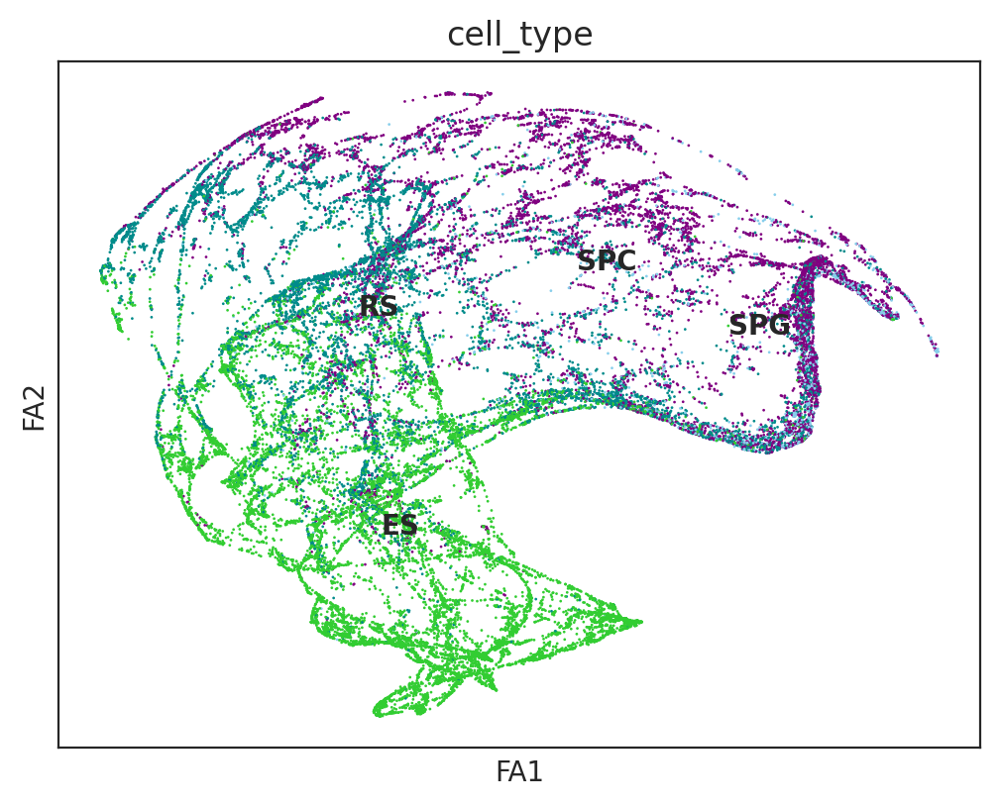

In [8]:
sc.tl.draw_graph(wt_adata, init_pos='paga', random_state=123)
sc.pl.draw_graph(wt_adata, color='cell_type', legend_loc='on data', save='_cell_type.pdf')

In [9]:
# In this notebook, we use the unscaled mRNA count for the input of Oracle object.
wt_adata.X = wt_adata.layers["raw_count"].copy()

# Instantiate Oracle object.
oracle_wt.import_anndata_as_raw_count(adata=wt_adata, cluster_column_name="cell_type", embedding_name="X_draw_graph_fa")

# You can load TF info dataframe with the following code.
oracle_wt.import_TF_data(TF_info_matrix=base_GRN)

# Alternatively, if you saved the informmation as a dictionary, you can use the code below.
# oracle.import_TF_data(TFdict=TFinfo_dictionary)

Total number of TF was 35. Although we can go to the GRN calculation with this data, but the TF number is small.


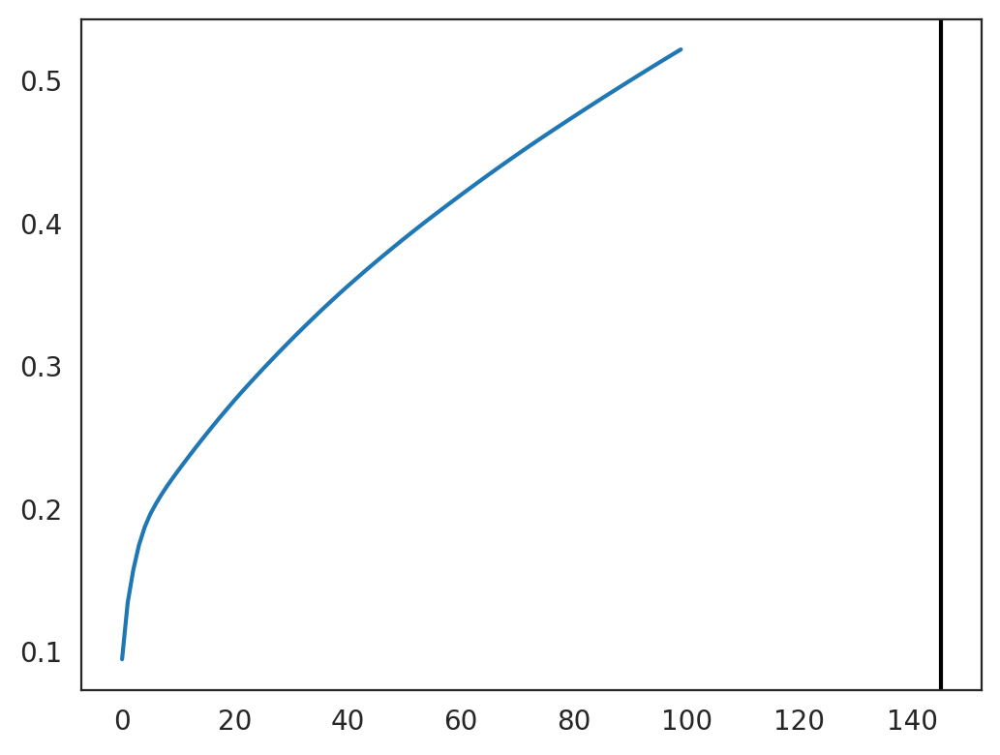

145


In [10]:
# Perform PCA
oracle_wt.perform_PCA()

# Select important PCs
plt.plot(np.cumsum(oracle_wt.pca.explained_variance_ratio_)[:100])
n_comps = np.where(np.diff(np.diff(np.cumsum(oracle_wt.pca.explained_variance_ratio_))>0.002))[0][0]
plt.axvline(n_comps, c="k")
plt.show()
print(n_comps)
n_comps = min(n_comps, 50)

cell number is :31032
Auto-selected k is :775


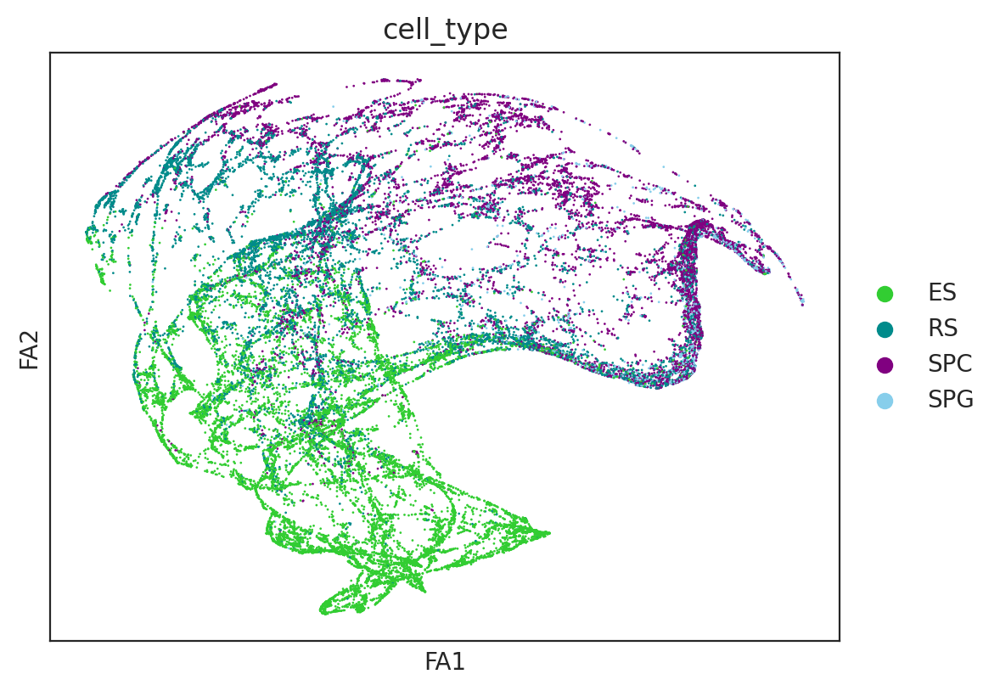

In [11]:
n_cell = oracle_wt.adata.shape[0]
print(f"cell number is :{n_cell}")
k = int(0.025*n_cell)
print(f"Auto-selected k is :{k}")
oracle_wt.knn_imputation(n_pca_dims=n_comps, k=k, balanced=True, b_sight=k*8,
                      b_maxl=k*4, n_jobs=4)
# Check clustering data
sc.pl.draw_graph(oracle_wt.adata, color="cell_type")

In [12]:
%%time
# Calculate GRN for each population in "louvain_annot" clustering unit.
# This step may take some time.(~30 minutes)
links_wt = oracle_wt.get_links(cluster_name_for_GRN_unit="cell_type", alpha=10, verbose_level=10)

  0%|          | 0/4 [00:00<?, ?it/s]

Inferring GRN for ES...


  0%|          | 0/1153 [00:00<?, ?it/s]

Inferring GRN for RS...


  0%|          | 0/1153 [00:00<?, ?it/s]

Inferring GRN for SPC...


  0%|          | 0/1153 [00:00<?, ?it/s]

Inferring GRN for SPG...


  0%|          | 0/1153 [00:00<?, ?it/s]

CPU times: user 3min, sys: 16.1 s, total: 3min 16s
Wall time: 4min 5s


In [13]:
# Change the order of pallete
order = ['ES', 'RS', 'SPC', 'SPG']#, 'Endothelial', 'Leydig', 'Macrophage', 'Myoid', 'Sertoli']
links_wt.palette = links_wt.palette.loc[order]
links_wt.filter_links(p=0.001, weight="coef_abs", threshold_number=2000)
#plt.rcParams["figure.figsize"] = [9, 4.5]
#links.plot_degree_distributions(plot_model=True)
plt.rcParams["figure.figsize"] = [6, 4.5]
# Calculate network scores.
links_wt.get_network_score()
print('Links score shape:',links_wt.merged_score.shape)
links_wt.merged_score.head()
# Visualize top n-th genes with high scores.
#links.plot_scores_as_rank(cluster="ES", n_gene=30, save=f"{save_folder}/ranked_score")

Links score shape: (2999, 9)


,degree_all,degree_centrality_all,degree_in,degree_centrality_in,degree_out,degree_centrality_out,betweenness_centrality,eigenvector_centrality,cluster
Dmrtb1,19,0.026207,0,0.000000,19,0.026207,0.0,0.110491,ES
Eef1g,10,0.013793,10,0.013793,0,0.000000,0.0,0.297910,ES
Smc3,165,0.227586,3,0.004138,162,0.223448,1028.0,1.000000,ES
Cypt4,1,0.001379,1,0.001379,0,0.000000,0.0,0.207184,ES
Sox9,42,0.057931,1,0.001379,41,0.056552,321.0,0.226195,ES


In [14]:
links_wt.merged_score.cluster.value_counts()

RS     796
SPC    743
SPG    734
ES     726
Name: cluster, dtype: int64

In [15]:
# Compare GRN score between two clusters

#links_wt.plot_score_comparison_2D(value="eigenvector_centrality",
#                               cluster1="ES", cluster2="RS",
#                               percentile=98,
#                               save=f"{save_folder}/score_comparison")
# Compare GRN score between two clusters
#links_wt.plot_score_comparison_2D(value="betweenness_centrality",
#                               cluster1="ES", cluster2="RS",
#                               percentile=98,
#                               save=f"{save_folder}/score_comparison")
# Compare GRN score between two clusters
#links_wt.plot_score_comparison_2D(value="degree_centrality_all",
#                               cluster1="ES", cluster2="RS",
#                               percentile=98, save=f"{save_folder}/score_comparison")
# Visualize Smc3 network score dynamics
#links_wt.plot_score_per_cluster(goi="Smc3", save=f"{save_folder}/network_score_per_gene/")

links_wt.filtered_links['ES']

,source,target,coef_mean,coef_abs,p,-logp
4177,Dmrtb1,Eef1g,-0.447427,0.447427,6.005573e-17,16.221446
2711,Smc3,Cypt4,0.381780,0.381780,5.213031e-32,31.282910
11701,Sox9,Sh3bp5,-0.347653,0.347653,7.948489e-14,13.099715
7418,Atf1,Hmgb4,-0.304101,0.304101,6.277971e-08,7.202181
610,Creb3l4,4933411K16Rik,-0.294060,0.294060,1.863557e-41,40.729657
...,...,...,...,...,...,...
13880,Hdac2,Stard10,-0.033429,0.033429,1.065594e-05,4.972408
1635,Hdac2,Atg12,0.033427,0.033427,3.645092e-15,14.438291
8866,Atf2,Ostc,0.033410,0.033410,3.444192e-10,9.462913
8149,Hdac2,Lsm7,0.033403,0.033403,2.840316e-10,9.546633


In [16]:
set(links_wt.filtered_links["ES"]['source'])

{'Atf1',
 'Atf2',
 'Atf4',
 'Creb3l4',
 'Crem',
 'Dmrt1',
 'Dmrtb1',
 'Egr1',
 'Elf2',
 'Eno1',
 'Ezh2',
 'Gtf2i',
 'Hdac2',
 'Herpud1',
 'Hsf2',
 'Id2',
 'Lef1',
 'Mef2a',
 'Mga',
 'Mybl1',
 'Nfic',
 'Pknox1',
 'Rfx8',
 'Rhox8',
 'Smarca5',
 'Smarcb1',
 'Smarcc1',
 'Smarcc2',
 'Smc3',
 'Sox6',
 'Sox9',
 'Spz1',
 'Stat4',
 'Tcfl5'}

In [16]:
ES_df = links_wt.filtered_links['ES']
stat4_df = ES_df[ES_df.source == "Stat4"]

In [28]:
sub_df = ES_df[ES_df.source.isin(['Stat4', 'Spz1', 'Herpud1'])]

In [31]:
test = sub_df[sub_df.target=='Eif1']
test

,source,target,coef_mean,coef_abs,p,-logp
4450,Spz1,Eif1,0.232773,0.232773,1.376833e-11,10.861119
4453,Stat4,Eif1,0.122359,0.122359,5.690541e-08,7.244846


In [37]:
'Stat4' in test.source.tolist()

True

In [39]:
test[test.source=='Stat4'].iloc[0].at['coef_mean']

0.12235892

In [45]:
module_df = pd.read_csv('testis/modules_reorder-4.csv', index_col=0)
module_df

,reorder_ind,gene,modules,groups
0,0,Eef1g,1,NaN
1,4,1700009J07Rik,1,NaN
2,7,1700120K04Rik,1,NaN
3,8,1700080E11Rik,1,NaN
4,16,Gm5893,1,NaN
...,...,...,...,...
1365,1324,Smarca5,-1,NaN
1366,1139,Sycp1,-1,A
1367,1337,Supt16,-1,NaN
1368,1363,Zfp608,-1,NaN


In [46]:
target_genes = list(set(sub_df.target.tolist()))
new_df = pd.DataFrame(index=target_genes)

tfs_dict = {'Stat4': [], 'Spz1': [], 'Herpud1': []}
module_list = []

for gene in target_genes:
    module_list.append(module_df[module_df.gene==gene].iloc[0].at['modules'])
    sub_gene_df = sub_df[sub_df.target==gene]
    for tf in tfs_dict.keys():
        if tf in sub_gene_df.source.tolist():
            tfs_dict[tf].append(sub_gene_df[sub_gene_df.source==tf].iloc[0].at['coef_mean'])
        else:
            tfs_dict[tf].append('')

new_df['Stat4'] = tfs_dict['Stat4']
new_df['Spz1'] = tfs_dict['Spz1']
new_df['Herpud1'] = tfs_dict['Herpud1']
new_df['modules'] = module_list
new_df.to_csv(os.path.join(save_folder, 'all_target.csv'))

In [18]:
stat4_df.to_csv(os.path.join(save_folder, 'Stat4.csv'))
stat4_df

,source,target,coef_mean,coef_abs,p,-logp
3083,Stat4,Dlgap4,0.125142,0.125142,1.107572e-21,20.955628
4453,Stat4,Eif1,0.122359,0.122359,5.690541e-08,7.244846
1902,Stat4,Btg2,0.111923,0.111923,5.620771e-19,18.250204
14987,Stat4,Tmem194b,0.111631,0.111631,9.466004e-13,12.023833
6316,Stat4,Gpx4,0.111025,0.111025,2.300749e-18,17.638131
1545,Stat4,Atad1,0.108602,0.108602,1.275411e-29,28.894350
3462,Stat4,Dnajc7,0.099102,0.099102,1.397308e-17,16.854708
15628,Stat4,Wwp2,0.097625,0.097625,1.082442e-26,25.965595
7238,Stat4,Herpud1,0.097164,0.097164,1.511833e-11,10.820496
10241,Stat4,Rasa3,0.092678,0.092678,1.213628e-24,23.915914


In [19]:
stat4_df[stat4_df.target.isin(marker_genes_list)]

,source,target,coef_mean,coef_abs,p,-logp


In [20]:
stat4_df[stat4_df.target.isin(gene_list_b)]

,source,target,coef_mean,coef_abs,p,-logp
12128,Stat4,Smcp,0.070124,0.070124,8.141145e-10,9.089315


In [21]:
spz1_df = ES_df[ES_df.source == "Spz1"]
spz1_df[spz1_df.target.isin(marker_genes_list)]

,source,target,coef_mean,coef_abs,p,-logp


In [22]:
spz1_df[spz1_df.target.isin(gene_list_b)]

,source,target,coef_mean,coef_abs,p,-logp


In [23]:
herpud1_df = ES_df[ES_df.source == "Herpud1"]
herpud1_df[herpud1_df.target.isin(marker_genes_list)]

,source,target,coef_mean,coef_abs,p,-logp


In [24]:
herpud1_df[herpud1_df.target.isin(gene_list_b)]

,source,target,coef_mean,coef_abs,p,-logp


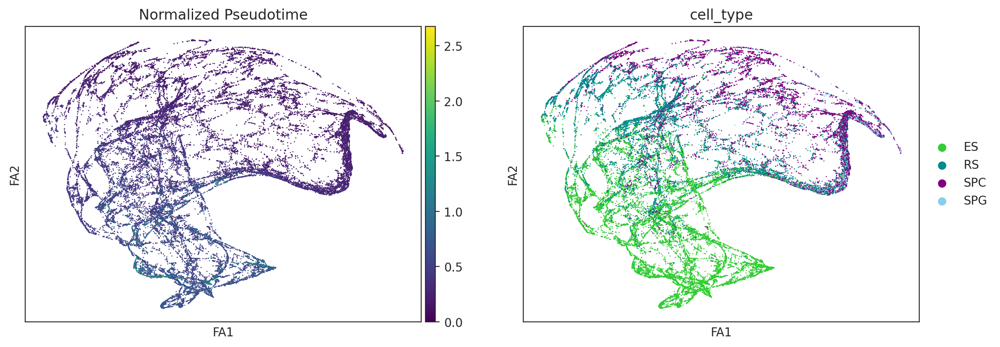

In [17]:
sc.pl.draw_graph(oracle_wt.adata, color=['Normalized Pseudotime', oracle_wt.cluster_column_name],
                 use_raw=False, cmap="viridis")

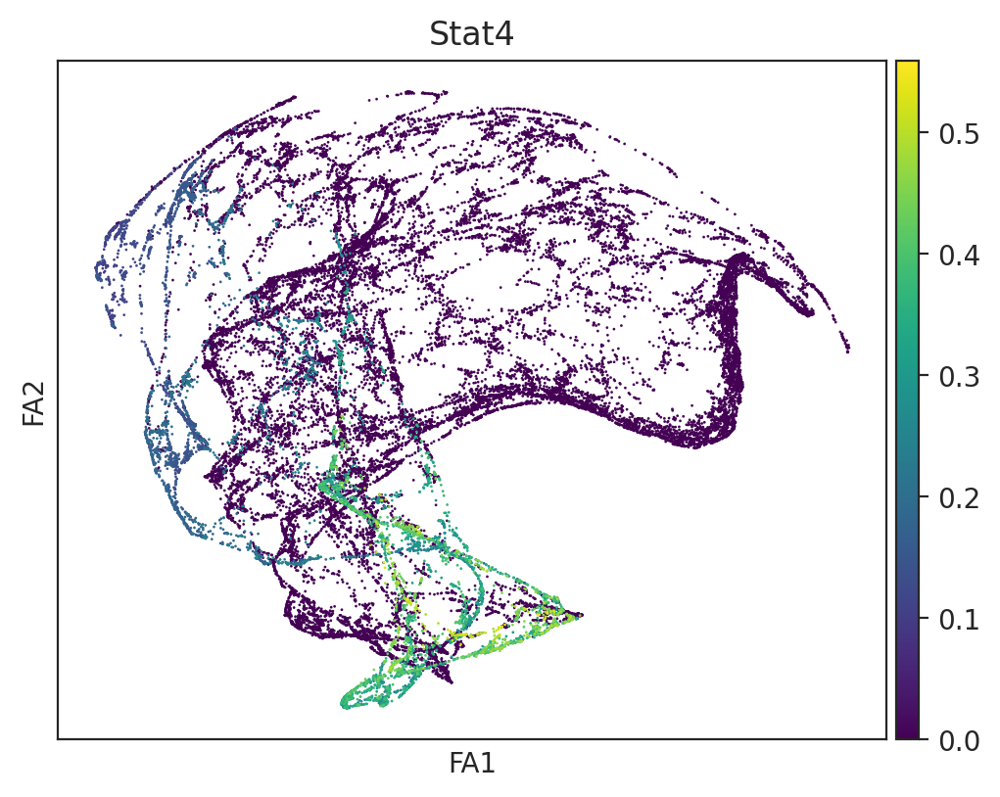

  0%|          | 0/4 [00:00<?, ?it/s]

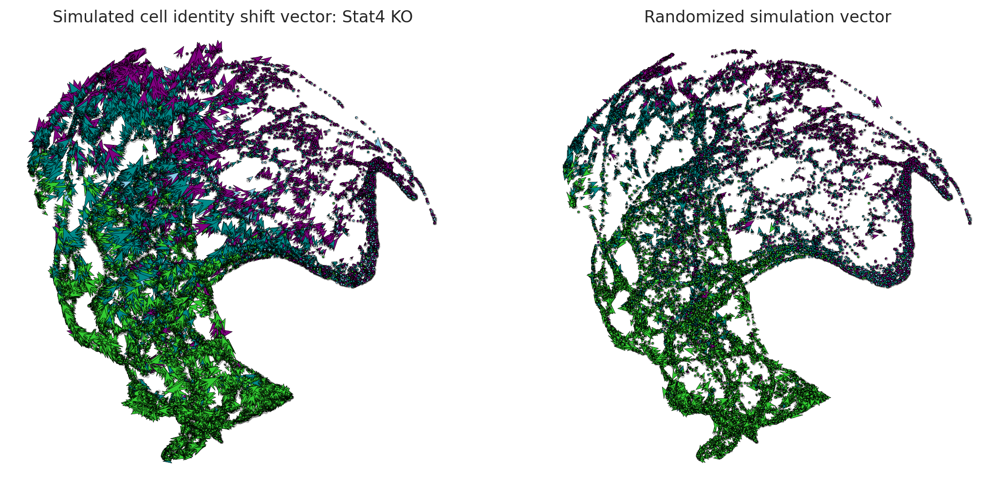

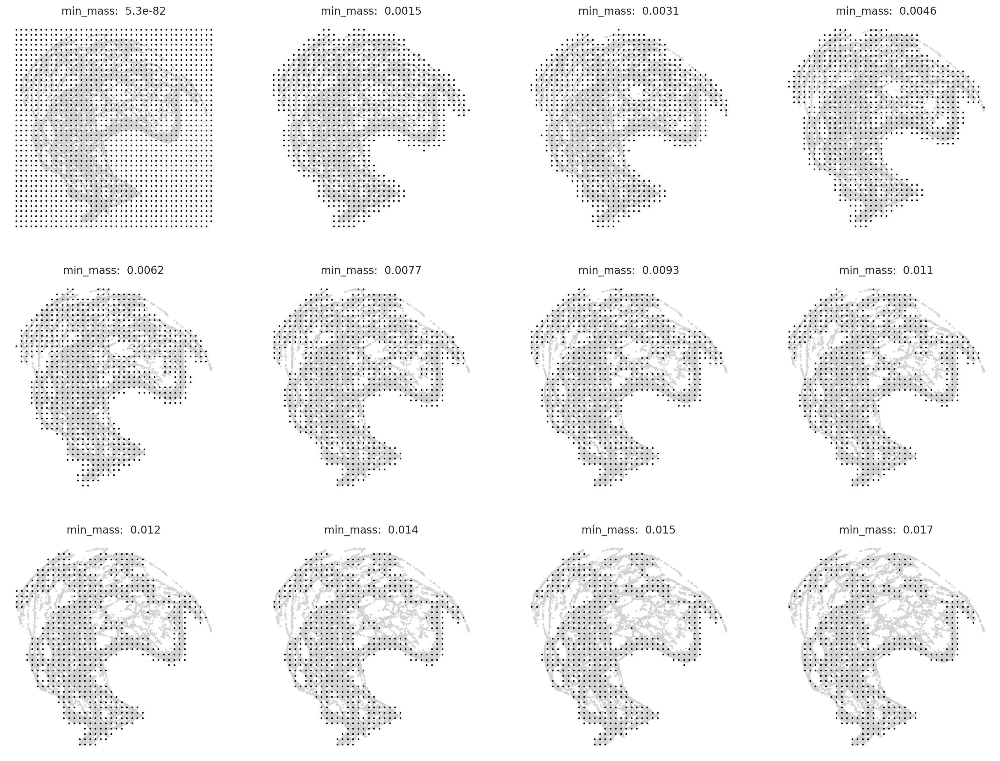

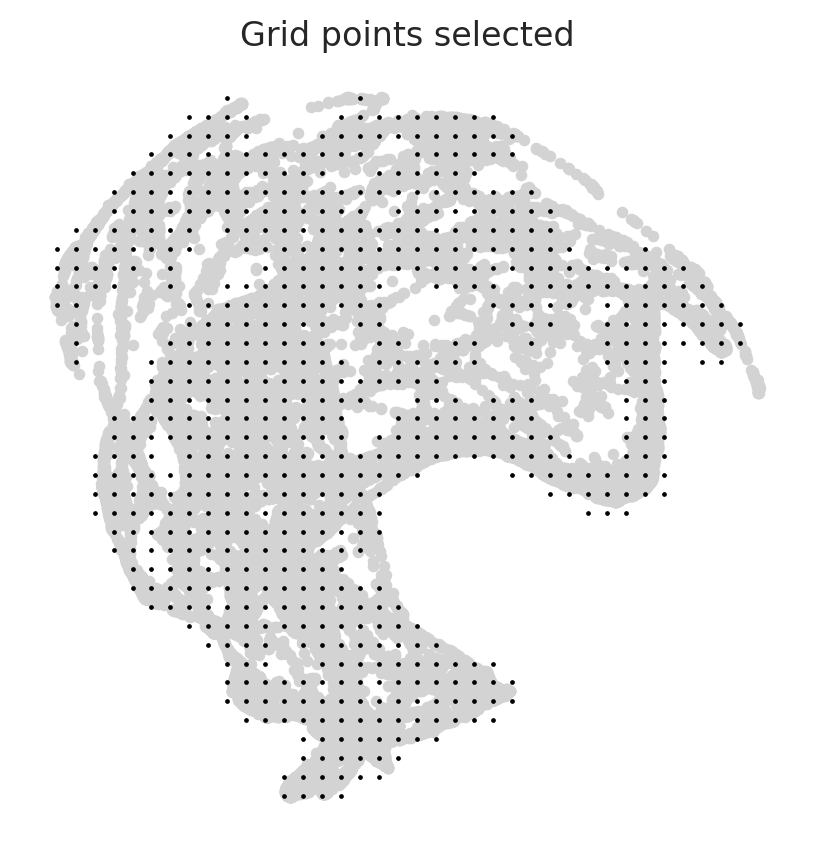

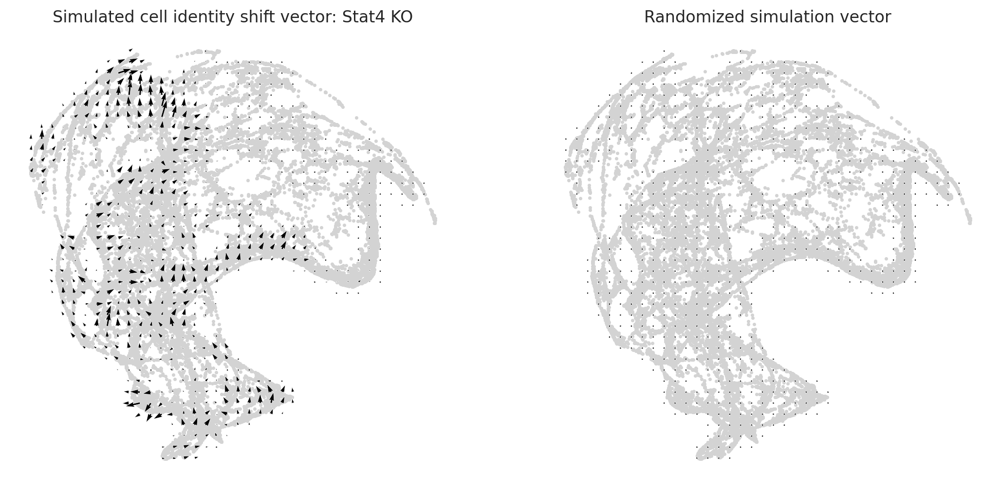

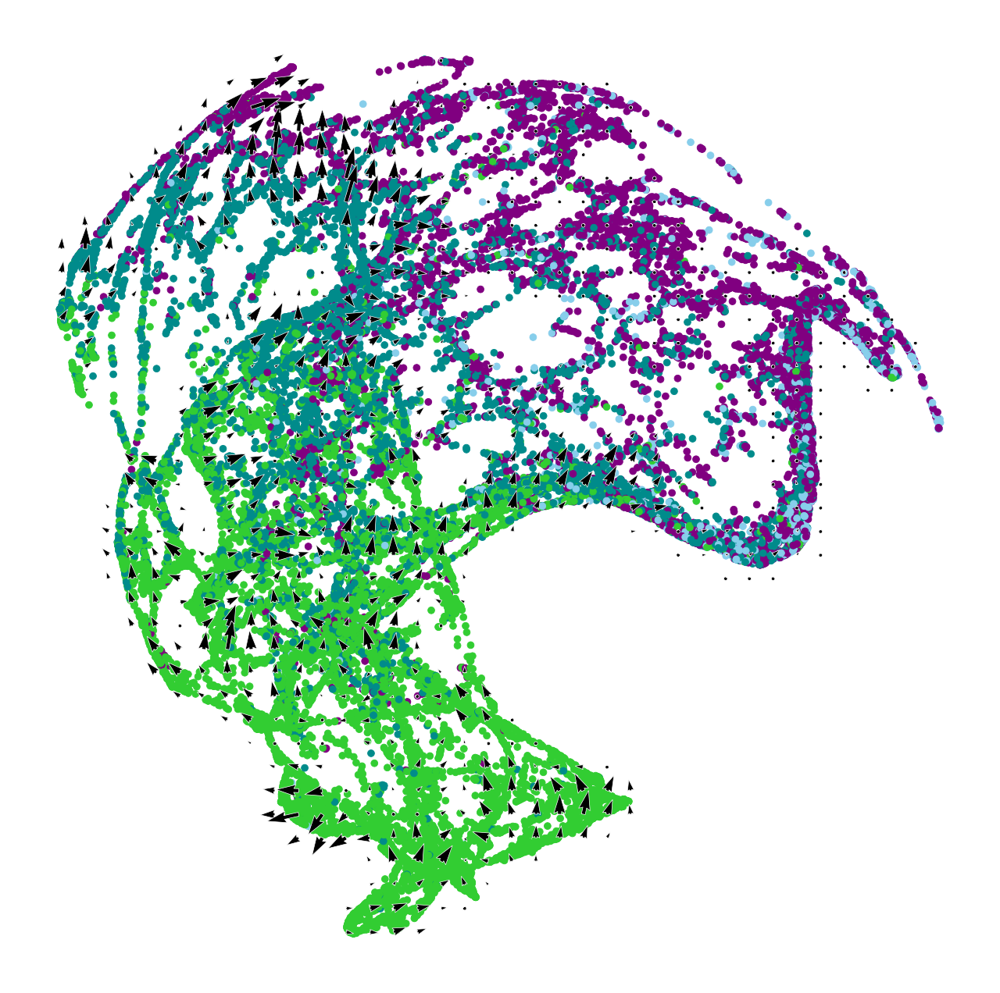

In [18]:
tf = 'Stat4'
oracle_wt_ana = oracle_wt.copy()
sc.pl.draw_graph(oracle_wt_ana.adata, color=tf, use_raw=False, cmap="viridis")
# Plot gene expression in histogram
#sc.get.obs_df(oracle_wt.adata, keys=[tf]).hist()
#plt.show()

oracle_wt_ana.get_cluster_specific_TFdict_from_Links(links_object=links_wt)
oracle_wt_ana.fit_GRN_for_simulation(alpha=10, use_cluster_specific_TFdict=True)

# Enter perturbation conditions to simulate signal propagation after the perturbation.
oracle_wt_ana.simulate_shift(perturb_condition={tf: 0.0}, n_propagation=3)

    
# Get transition probability
oracle_wt_ana.estimate_transition_prob(n_neighbors=200, knn_random=True, sampled_fraction=1)
# Calculate embedding
oracle_wt_ana.calculate_embedding_shift(sigma_corr=0.05)

fig, ax = plt.subplots(1, 2,  figsize=[13, 6])
scale = 25
# Show quiver plot
oracle_wt_ana.plot_quiver(scale=scale, ax=ax[0])
ax[0].set_title(f"Simulated cell identity shift vector: {tf} KO")
# Show quiver plot that was calculated with randomized graph.
oracle_wt_ana.plot_quiver_random(scale=scale, ax=ax[1])
ax[1].set_title(f"Randomized simulation vector")
fig.savefig(os.path.join(save_folder, 'shift_vector.pdf'), bbox_inches='tight', dpi=100)
plt.show()

# n_grid = 40 is a good starting value.
n_grid = 40
oracle_wt_ana.calculate_p_mass(smooth=0.8, n_grid=n_grid, n_neighbors=200)
# Search for best min_mass.
oracle_wt_ana.suggest_mass_thresholds(n_suggestion=12)

min_mass = 0.01
oracle_wt_ana.calculate_mass_filter(min_mass=min_mass, plot=True)

fig, ax = plt.subplots(1, 2,  figsize=[13, 6])
scale_simulation = 0.5
# Show quiver plot
oracle_wt_ana.plot_simulation_flow_on_grid(scale=scale_simulation, ax=ax[0])
ax[0].set_title(f"Simulated cell identity shift vector: {tf} KO")
# Show quiver plot that was calculated with randomized graph.
oracle_wt_ana.plot_simulation_flow_random_on_grid(scale=scale_simulation, ax=ax[1])
ax[1].set_title(f"Randomized simulation vector")
fig.savefig(os.path.join(save_folder, 'shift_vector2.pdf'), bbox_inches='tight', dpi=100)
plt.show()

# Plot vector field with cell cluster
fig, ax = plt.subplots(figsize=[8, 8])
oracle_wt_ana.plot_cluster_whole(ax=ax, s=10)
oracle_wt_ana.plot_simulation_flow_on_grid(scale=scale_simulation, ax=ax, show_background=False)
fig.savefig(os.path.join(save_folder, 'vector_field.pdf'), bbox_inches='tight', dpi=100)

In [ ]:
# Visualize pseudotime
fig, ax = plt.subplots(figsize=[6,6])

sc.pl.embedding(adata=oracle_wt_ana.adata, basis=oracle_wt_ana.embedding_name, ax=ax, cmap="rainbow",
                color=["Pseudotime"])

In [19]:
from celloracle.applications import Gradient_calculator

# Instantiate Gradient calculator object
gradient = Gradient_calculator(oracle_object=oracle_wt_ana, pseudotime_key="Normalized Pseudotime")

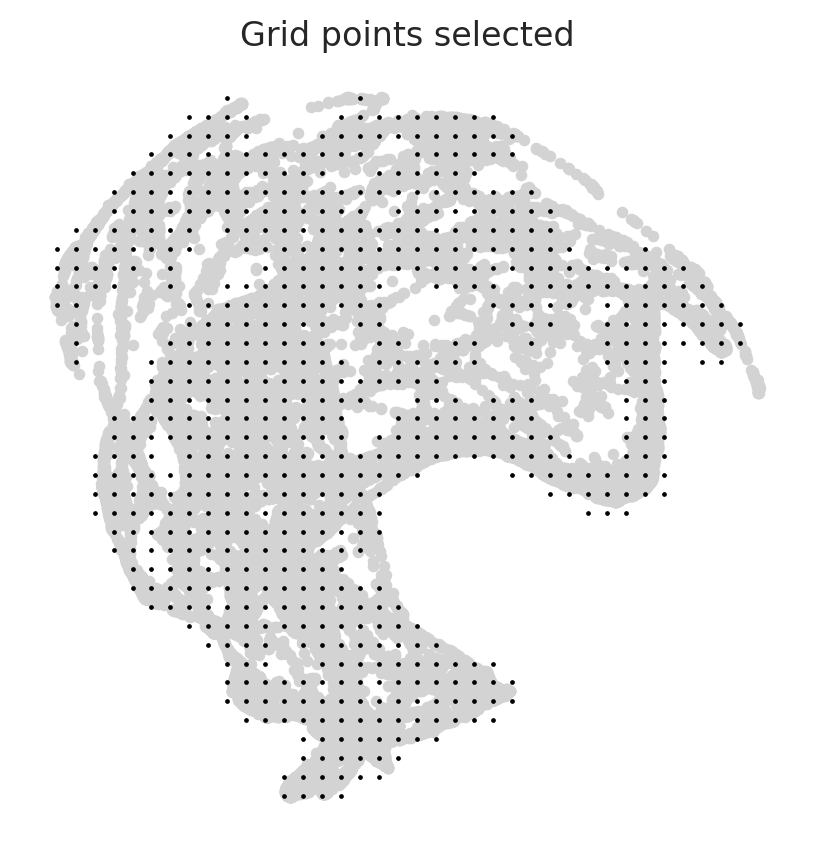

In [20]:
gradient.calculate_p_mass(smooth=0.8, n_grid=n_grid, n_neighbors=200)
gradient.calculate_mass_filter(min_mass=min_mass, plot=True)

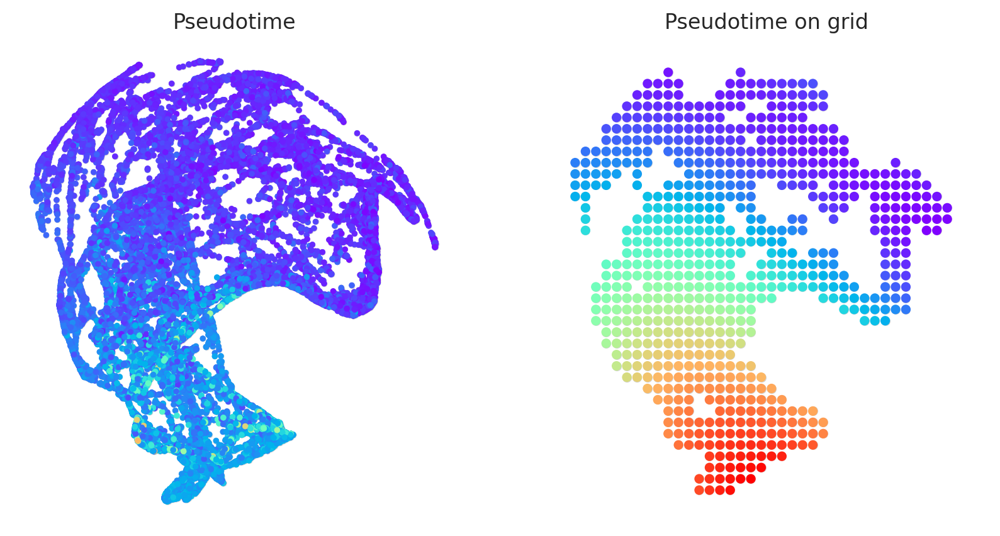

In [21]:
gradient.transfer_data_into_grid(args={"method": "polynomial", "n_poly":3}, plot=True)

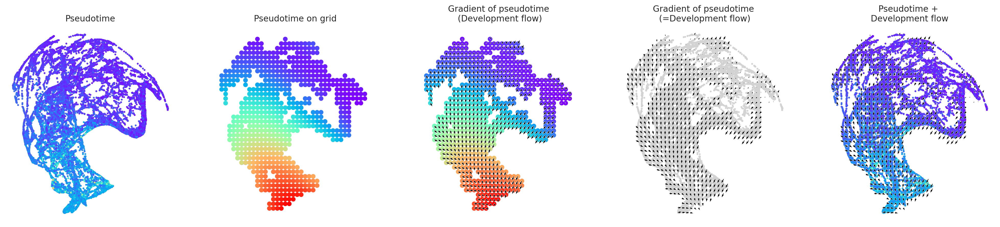

In [22]:
# Calculate graddient
gradient.calculate_gradient()

# Show results
scale_dev = 40
gradient.visualize_results(scale=scale_dev, s=5)

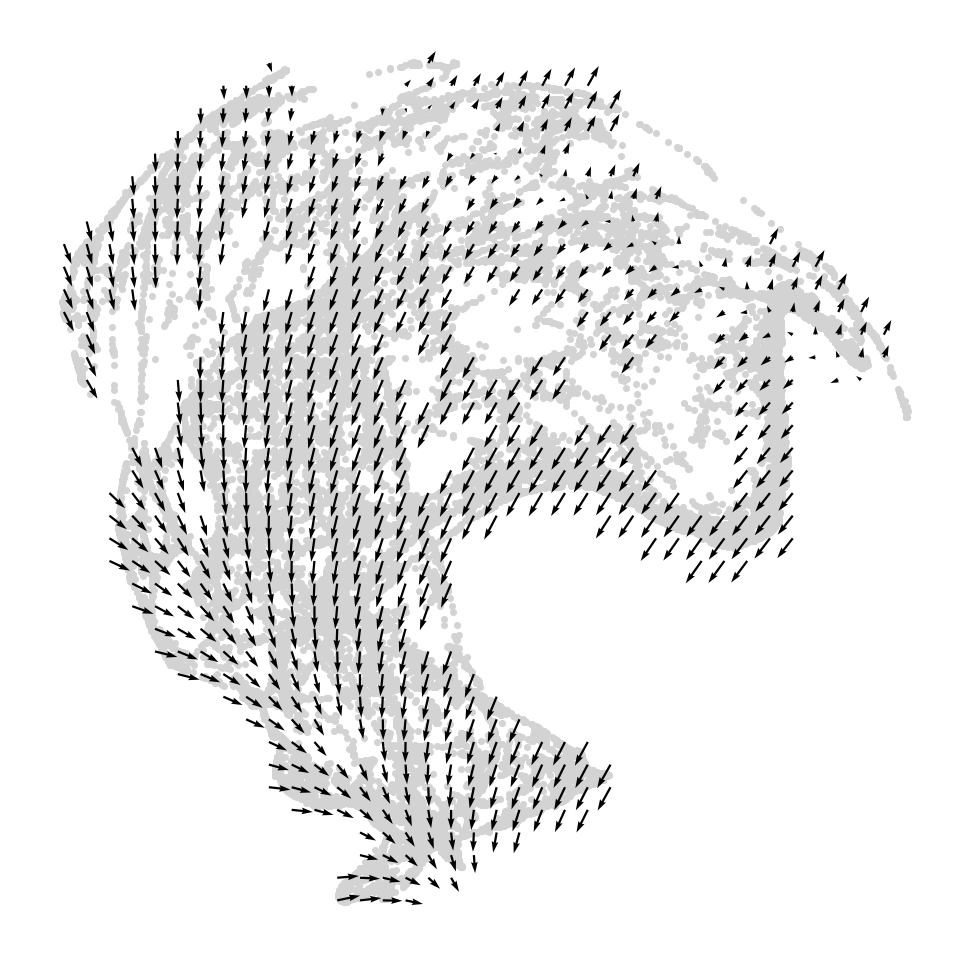

In [23]:
# Visualize results
fig, ax = plt.subplots(figsize=[6, 6])
gradient.plot_dev_flow_on_grid(scale=scale_dev, ax=ax)
fig.savefig(os.path.join(save_folder, 'pseudotime_flow.pdf'), bbox_inches='tight', dpi=100)

In [ ]:
# Visualize results
fig, ax = plt.subplots(figsize=[6, 6])        

#gradient.plot_pseudotime_on_grid(ax=ax, s=s_grid, show_background=True)
gradient.plot_reference_flow_on_grid(ax=ax, scale=scale_dev, show_background=False)
ax.set_title("Gradient of pseudotime \n(Development flow)")


In [24]:
from celloracle.applications import Oracle_development_module

# Make Oracle_development_module to compare two vector field
dev = Oracle_development_module()

# Load development flow
dev.load_differentiation_reference_data(gradient_object=gradient)

# Load simulation result
dev.load_perturb_simulation_data(oracle_object=oracle_wt_ana)

# Calculate inner produc scores
dev.calculate_inner_product()
dev.calculate_digitized_ip(n_bins=10)

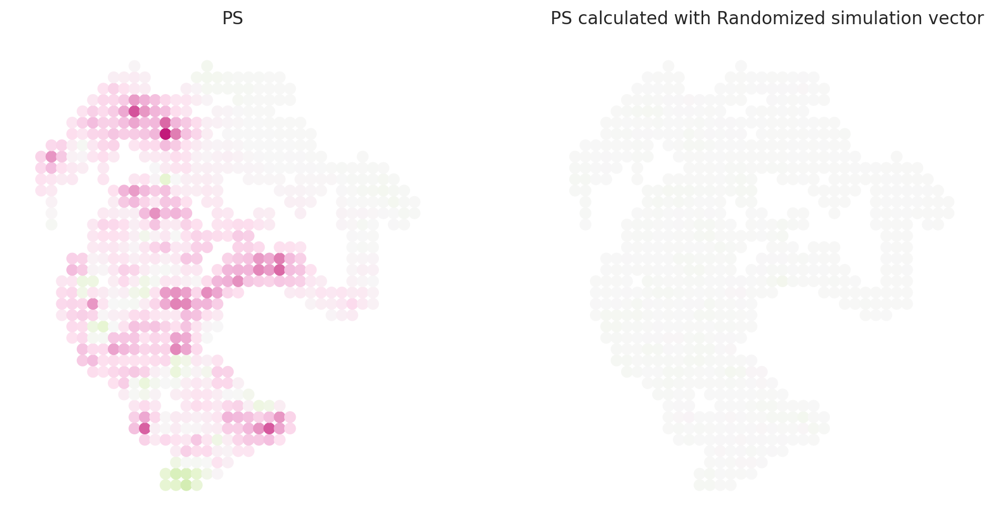

In [25]:
# Show perturbation scores
vm = 0.02

fig, ax = plt.subplots(1, 2, figsize=[12, 6])
dev.plot_inner_product_on_grid(vm=0.02, s=50, ax=ax[0])
ax[0].set_title(f"PS")

dev.plot_inner_product_random_on_grid(vm=vm, s=50, ax=ax[1])
ax[1].set_title(f"PS calculated with Randomized simulation vector")
plt.show()

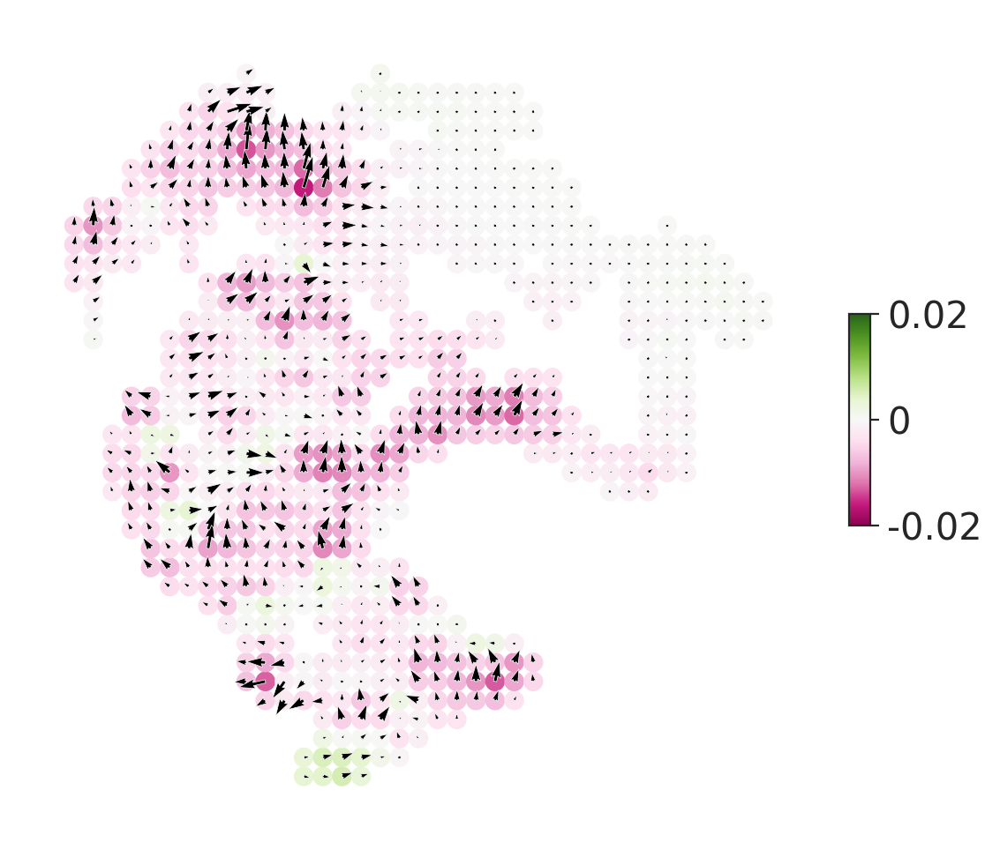

In [26]:
import copy
import matplotlib as mpl

cmap1 = copy.copy(mpl.cm.PiYG)
norm1 = mpl.colors.Normalize(vmin=-vm, vmax=vm)
im1 = mpl.cm.ScalarMappable(norm=norm1, cmap=cmap1)

# Show perturbation scores with perturbation simulation vector field
fig, ax = plt.subplots(figsize=[6, 6])
dev.plot_inner_product_on_grid(vm=vm, s=50, ax=ax)
dev.plot_simulation_flow_on_grid(scale=scale_simulation, show_background=False, ax=ax)

cb_ax = fig.add_axes([0.91, 0.4, 0.02, 0.2])
cbar = fig.colorbar(im1, cax=cb_ax)
cbar.ax.tick_params(labelsize=15)
cbar.set_ticks([-vm, 0, vm])
cbar.set_ticklabels([-vm, 0, vm])

fig.savefig(os.path.join(save_folder, 'inner_product_flow.pdf'), bbox_inches='tight', dpi=100)


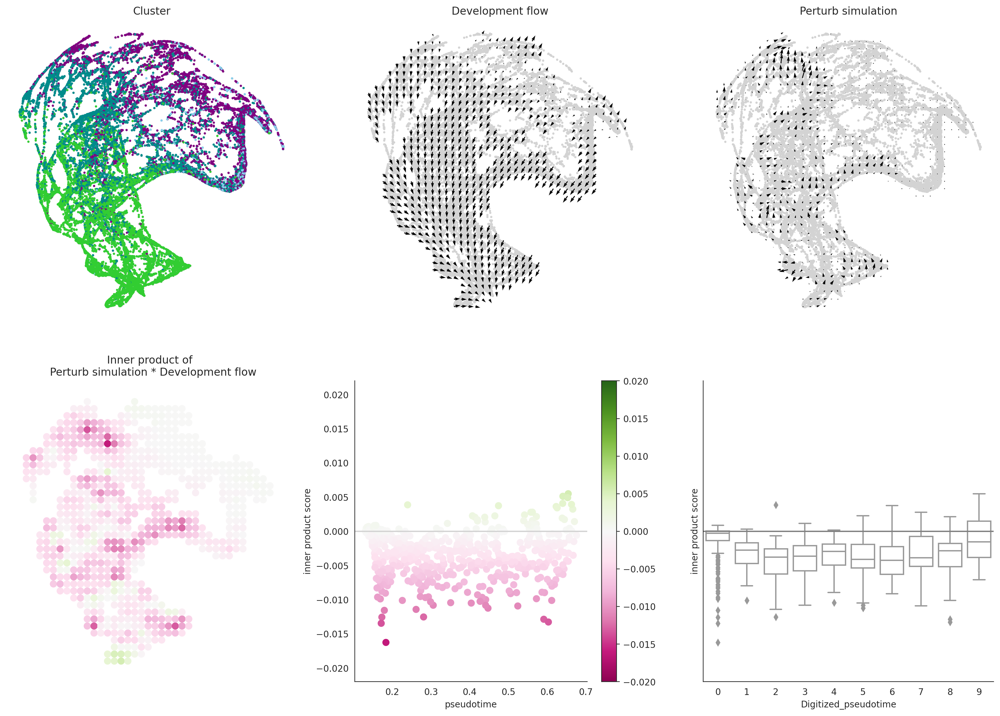

In [27]:
# Let's visualize the results
fig = dev.visualize_development_module_layout_0(s=5,
                                          scale_for_simulation=scale_simulation,
                                          s_grid=50,
                                          scale_for_pseudotime=scale_dev,
                                          vm=vm,
                                          return_fig=True)
fig.savefig(os.path.join(save_folder, 'perturbation_score_statistic.pdf'), bbox_inches='tight', dpi=100)